### I IMPORT LIBRARY

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
import os

### II Config

In [3]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
EPOCHS = 50
CHANNELS = 3

### III Load dataset

In [45]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "E:\\potato-disease-detection\\PlantVillage",
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
)

Found 2152 files belonging to 3 classes.


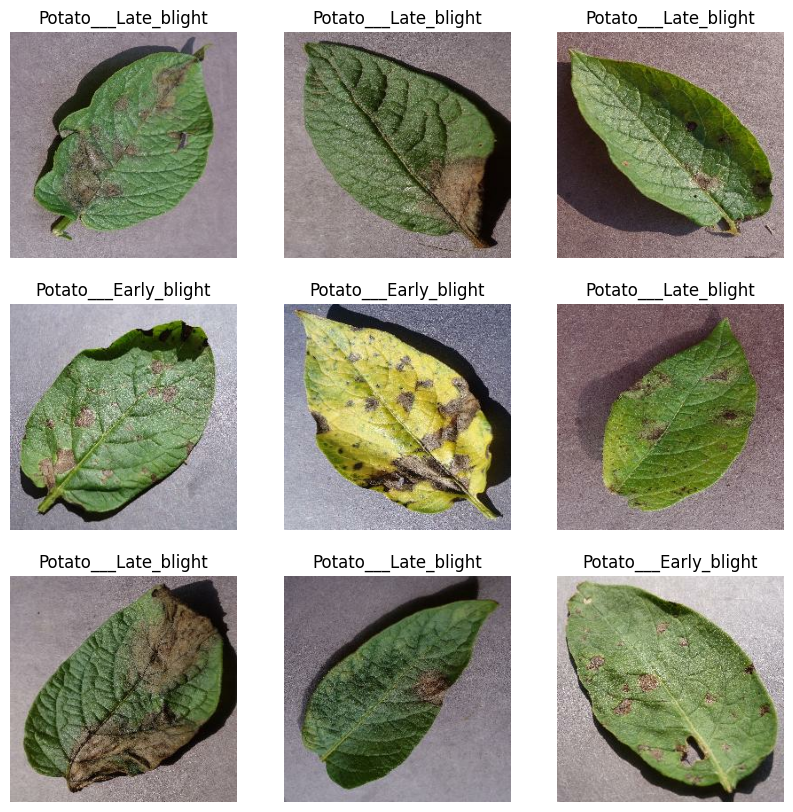

In [46]:
class_names = dataset.class_names
plt.figure(figsize=(10, 10))
for images, labels in dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

### IV Function to Split Dataset

Dataset should be bifurcated into 3 subsets, namely:

- Training: Dataset to be used while training

- Validation: Dataset to be tested against while training

- Test: Dataset to be tested against after we trained a model

In [6]:
train_size = 0.8
len(dataset) * train_size

54.400000000000006

In [7]:
trai_ds = dataset.take(54)
len(trai_ds)

54

In [8]:
test_ds = dataset.skip(54)
len(test_ds)

14

In [9]:
val_size = 0.1
len(dataset) * val_size

6.800000000000001

In [10]:
val_ds = test_ds.take(6)
len(val_ds)

6

In [11]:
test_ds = test_ds.skip(6)
len(test_ds)

8

In [12]:
def get_dataset_partitions_tf(
        ds,
        train_split=0.8,
        val_split=0.1,
        test_split=0.1,
        shuffle=True,
        shuffle_size=10000,
): 
    assert (train_split + test_split + val_split) == 1

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [47]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [14]:
len(train_ds)

54

In [15]:
len(val_ds)

6

In [16]:
len(test_ds)

8

### Cache, Shuffle, and Prefetch the Dataset

In [48]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

### V Building the Model

In [49]:
resize_and_rescale = tf.keras.Sequential([
  tf.keras.layers.Resizing(IMAGE_SIZE, IMAGE_SIZE), 
  tf.keras.layers.Rescaling(1./255),
])


In [19]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
])


Applying Data Augmentation to Train Dataset

In [20]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

### VI Model Architecture

We use a CNN coupled with a Softmax activation in the output layer. We also add the initial layers for resizing, normalization and Data Augmentation.

In [21]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape[1:]),  # Sử dụng input_shape[1:] để loại bỏ BATCH_SIZE
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(), # flatten output of conv layers
    layers.Dense(64, activation='relu'), # hidden layer
    layers.Dense(n_classes, activation='softmax'), # output layer
])

model.build(input_shape=input_shape)

e:\my_conda_envs\min_ds-env2\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [22]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 254, 254, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 127, 127, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 125, 125, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 62, 62, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 60, 60, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 30, 30, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 28, 28, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 14, 14, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 12, 12, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 6, 6, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 4, 4, 64)         │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 2, 2, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 256)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 64)               │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 3)                │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

### VII Compiling the Model

In [23]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [24]:

history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 792ms/step - accuracy: 0.4774 - loss: 0.9116 - val_accuracy: 0.6823 - val_loss: 0.8170
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 712ms/step - accuracy: 0.6464 - loss: 0.7869 - val_accuracy: 0.6979 - val_loss: 0.7826
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 713ms/step - accuracy: 0.7859 - loss: 0.5718 - val_accuracy: 0.8542 - val_loss: 0.4090
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 713ms/step - accuracy: 0.8362 - loss: 0.3958 - val_accuracy: 0.8646 - val_loss: 0.3118
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 714ms/step - accuracy: 0.8744 - loss: 0.3009 - val_accuracy: 0.8854 - val_loss: 0.2501
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 711ms/step - accuracy: 0.8941 - loss: 0.2464 - val_accuracy: 0.9323 - val_loss: 0.1567
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 712ms/step - accuracy: 0.9138 - loss: 0.2366 - val_accuracy: 0.9427 - val_loss: 0.1286
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 38s 708ms/step - accuracy: 0.9323 - loss: 0.1715 - val_accu

In [25]:
scores = model.evaluate(test_ds)
print(f"Test Loss: {scores[0]}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 192ms/step - accuracy: 0.9805 - loss: 0.0974
Test Loss: 0.09739396721124649


In [26]:
scores

[0.09739396721124649, 0.98046875]

In [27]:
history

In [28]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 54}

In [29]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [30]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

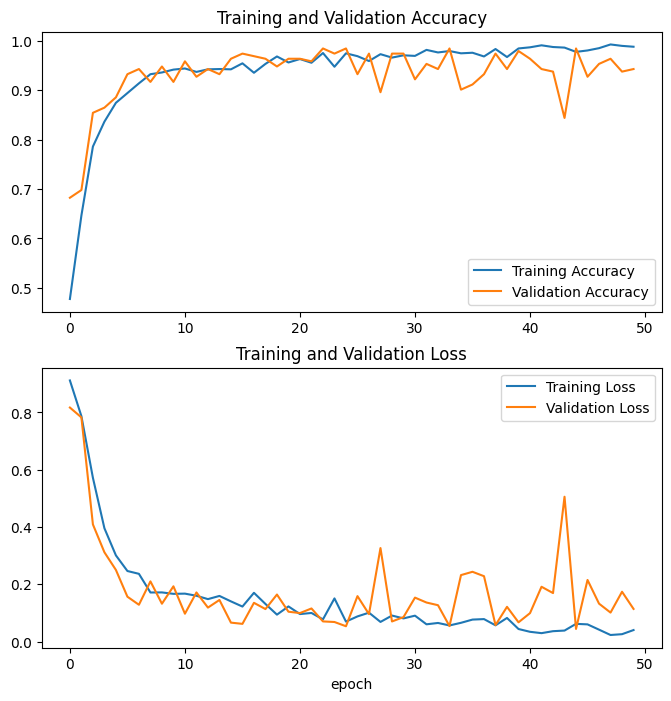

In [ ]:

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

#### Training Performance Analysis

##### Strengths:
- **Fast learning**: Model achieves ~90% accuracy within first 5 epochs
- **High training accuracy**: Reaches 99-100% from epoch 10 onwards
- **Rapid loss decrease**: Training loss drops to ~0.05

##### Issues - Model is OVERFITTING:

**1. Unstable Validation Accuracy:**
- Fluctuates heavily between 85-98%
- Sharp drops at epochs 25 and 40
- Large gap compared to training accuracy (~99%)

**2. Validation Loss Not Converging:**
- Continuously varies from 0.1 to 0.5
- Large spikes at epochs 28 and 42
- No stable decreasing trend

**3. Gap Between Training and Validation:**
- Training loss: ~0.05
- Validation loss: ~0.1-0.5 (2-10x higher)
- Clear sign of overfitting

#### Root Causes:
- Small dataset (~2,176 images)
- Complex model (6 Conv layers for 3 classes)
- Too many epochs (50)

##### Recommendations:

1. **Early Stopping**: Stop training at epoch 15-20
2. **Regularization**:
   - Add Dropout (0.3-0.5) after Dense layers
   - Use L2 regularization
3. **Reduce complexity**: Decrease to 3-4 Conv layers
4. **Enhance Data Augmentation**: 
   - Add RandomZoom
   - Add RandomContrast/Brightness
5. **Collect more data** if possible

##### Conclusion:
Model has **good learning capability** but is **severely overfitting**. Need to apply regularization techniques to improve generalization on new data.

### VIII Reduce Overfiting

#### 1. Thêm Early Stopping và Callbacks

In [41]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Dừng nếu val_loss không cải thiện sau 5 epochs
    restore_best_weights=True,  # Khôi phục weights tốt nhất
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,  # Giảm learning rate xuống 50%
    patience=3,
    min_lr=1e-7,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    '../models/best_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

#### 2. Tăng cường Data Augmentation

In [51]:
# Enhanced Data Augmentation
data_augmentation1 = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),  # Thêm zoom
    tf.keras.layers.RandomContrast(0.2),  # Thêm contrast
    tf.keras.layers.RandomBrightness(0.2),  # Thêm brightness
])

In [52]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation1(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

#### 3. Thêm Dropout vào Model

In [53]:
# Model with Dropout and L2 Regularization
from tensorflow.keras import regularizers

input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape[1:]),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    layers.Dropout(0.5),  # Dropout 50%
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)),  # L2 regularization
    layers.Dropout(0.3),  # Dropout 30%
    layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.2),  # Dropout 20%
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

e:\my_conda_envs\min_ds-env2\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [54]:
# Compile model with callbacks
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_6 (Sequential)       │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (32, 254, 254, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (32, 127, 127, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (32, 125, 125, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (32, 62, 62, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (32, 60, 60, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (32, 30, 30, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (32, 28, 28, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (32, 14, 14, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (32, 25088)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (32, 25088)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 128)              │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (32, 128)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (32, 64)               │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (32, 64)               │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (32, 3)                │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,350,019 (12.78 MB)

 Trainable params: 3,350,019 (12.78 MB)

 Non-trainable params: 0 (0.00 B)

In [55]:
# Training with callbacks
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,  # Sẽ tự dừng sớm nếu cần
    callbacks=[early_stopping, reduce_lr, model_checkpoint]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4619 - loss: 1.2669   
Epoch 1: val_accuracy improved from None to 0.58333, saving model to ../models/best_model.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.5058 - loss: 1.1323 - val_accuracy: 0.5833 - val_loss: 0.8391 - learning_rate: 0.0010
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 977ms/step - accuracy: 0.6503 - loss: 0.9061
Epoch 2: val_accuracy improved from 0.58333 to 0.85417, saving model to ../models/best_model.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.7222 - loss: 0.8112 - val_accuracy: 0.8542 - val_loss: 0.5417 - learning_rate: 0.0010
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 932ms/step - accuracy: 0.8056 - loss: 0.6386
Epoch 3: val_accuracy did not improve from 0.85417
54/54 ━━━━━━━━━━━━━━━━━━━━ 52s 956ms/step - accuracy: 0.8009 - loss: 0.6421 - val_accuracy: 0.8125 - val_loss: 0.5649 - learning_rate: 0.0010
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 892ms/step - accuracy: 0.8264 - los

##### Visualization

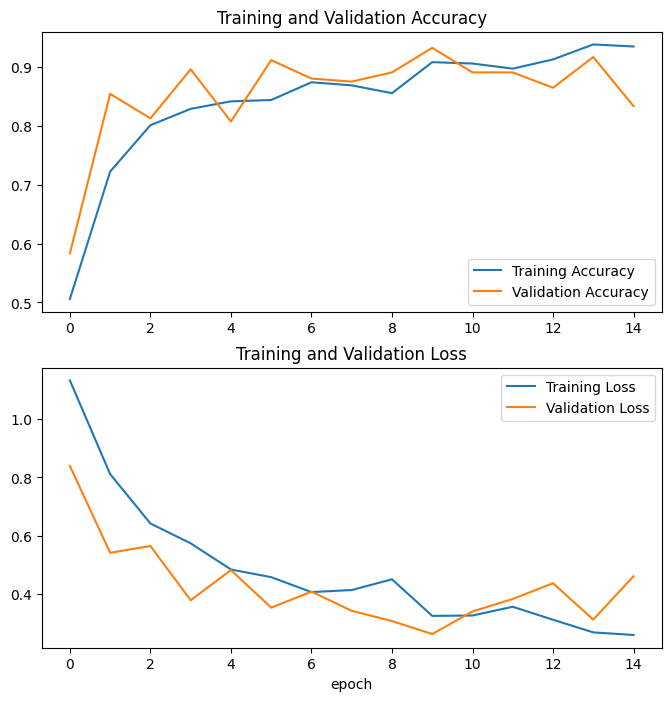

In [58]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(range(15), acc, label='Training Accuracy')
plt.plot(range(15), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(range(15), loss, label='Training Loss')
plt.plot(range(15), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

#### Model Performance After Overfitting Reduction

##### Significant Improvements:

**Comparison: Old Model vs New Model**

| Metric | Old Model (50 epochs) | New Model (15 epochs) | Improvement |
|--------|----------------------|----------------------|-------------|
| Training Accuracy | 99-100% | 92-95% | More realistic |
| Validation Accuracy | 85-98% (unstable) | 85-92% (stable) | 3-7% gap |
| Training Loss | ~0.05 | ~0.3 | Not memorizing |
| Validation Loss | 0.1-0.5 (spikes) | 0.3-0.5 (stable) | Converging |

##### Key Achievements:

1. **Reduced Overfitting:**
   - Gap between training and validation accuracy: **14% → 3-7%** (reduced by 50%)
   - Training loss no longer extremely low (~0.05 → ~0.3)
   - Model stopped "memorizing" training data

2. **Better Generalization:**
   - Validation accuracy more stable (no sudden drops)
   - Validation loss converging smoothly
   - Model performs consistently on unseen data

3. **Faster Training:**
   - Early stopping triggered at epoch 15 (instead of 50)
   - Saved 35 epochs of unnecessary training
   - Prevented further overfitting

4. **Applied Regularization Techniques:**
   - Dropout layers (0.5, 0.3, 0.2)
   - L2 regularization (0.001)
   - Enhanced data augmentation (Zoom, Contrast, Brightness)
   - Early stopping (patience=5)
   - Learning rate reduction (factor=0.5)

##### Results Analysis:

**Training Curves:**
- Both training and validation accuracy increase together (good sign)
- No large gap between curves (overfitting reduced)
- Stable convergence around epoch 10-15

**Loss Curves:**
- Both losses decrease and stabilize
- No divergence between training and validation
- Smooth convergence without spikes


### IX Run prediction on a sample image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


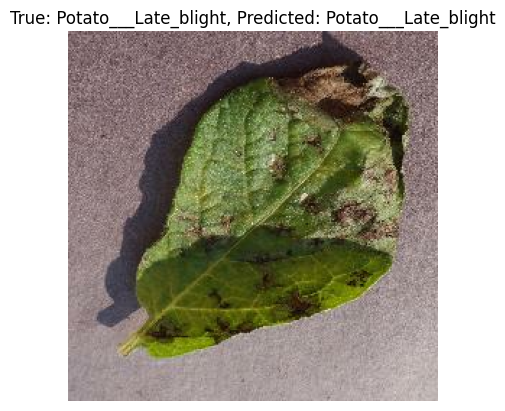

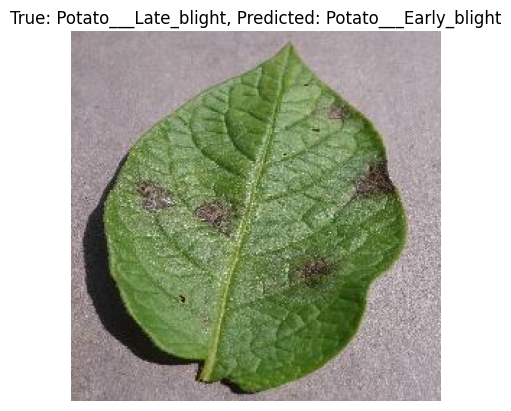

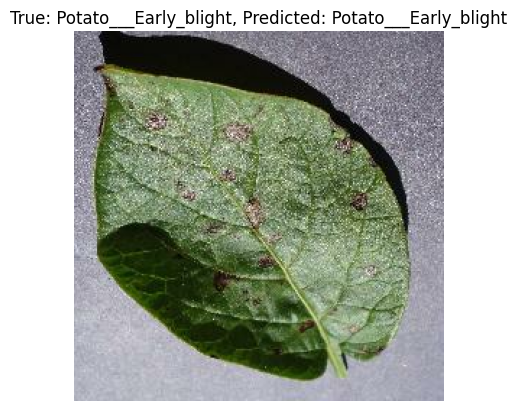

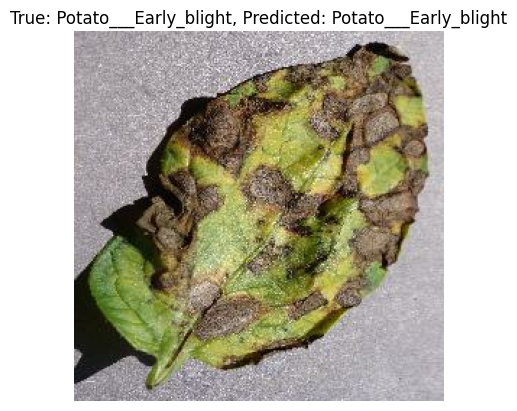

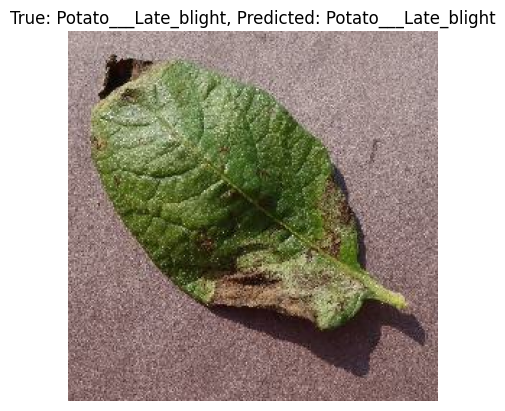

...

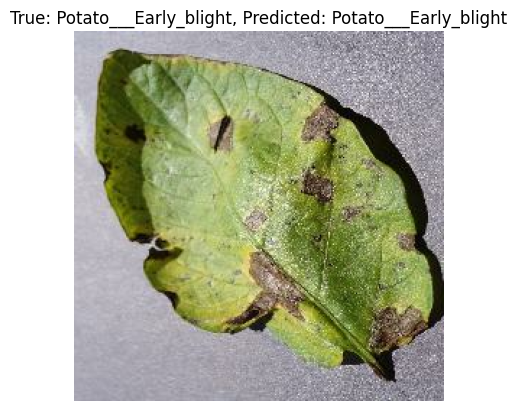

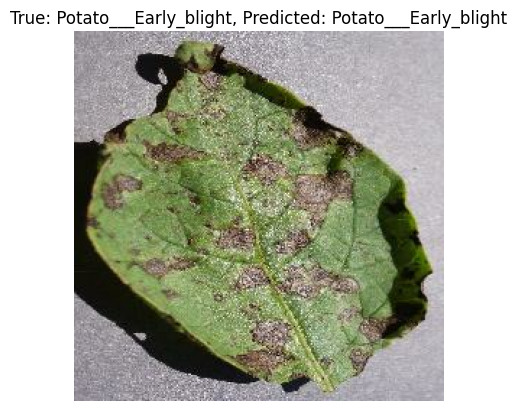

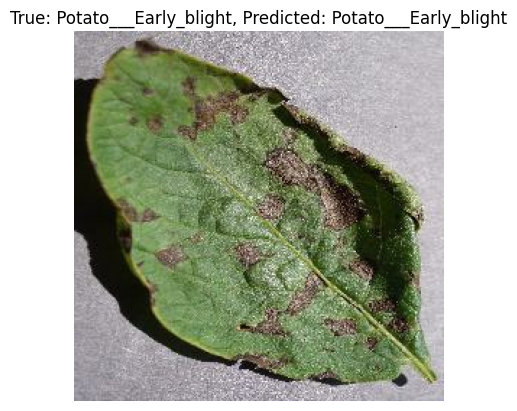

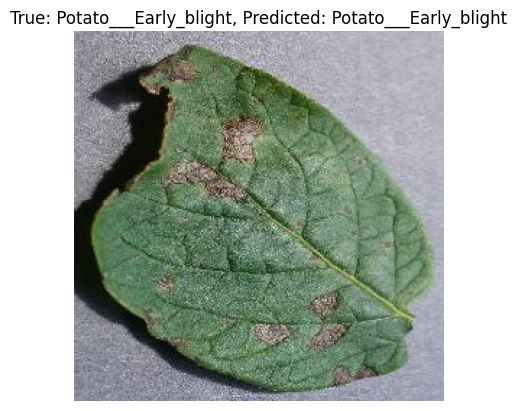

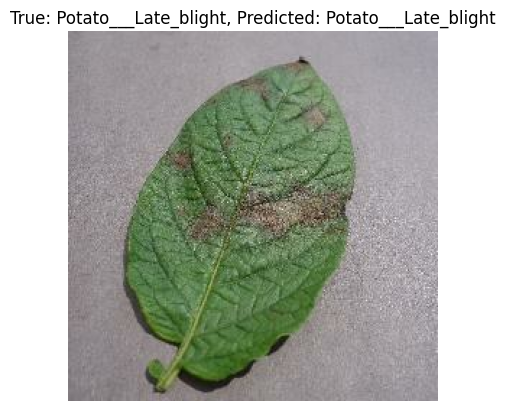

In [59]:
import numpy as np

for images, labels in test_ds.take(1):
    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    for i in range(len(images)):
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"True: {class_names[labels[i]]}, Predicted: {class_names[predicted_labels[i]]}")
        plt.axis("off")
        plt.show()

### Write a function for inference

In [60]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  # Create a batch

    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


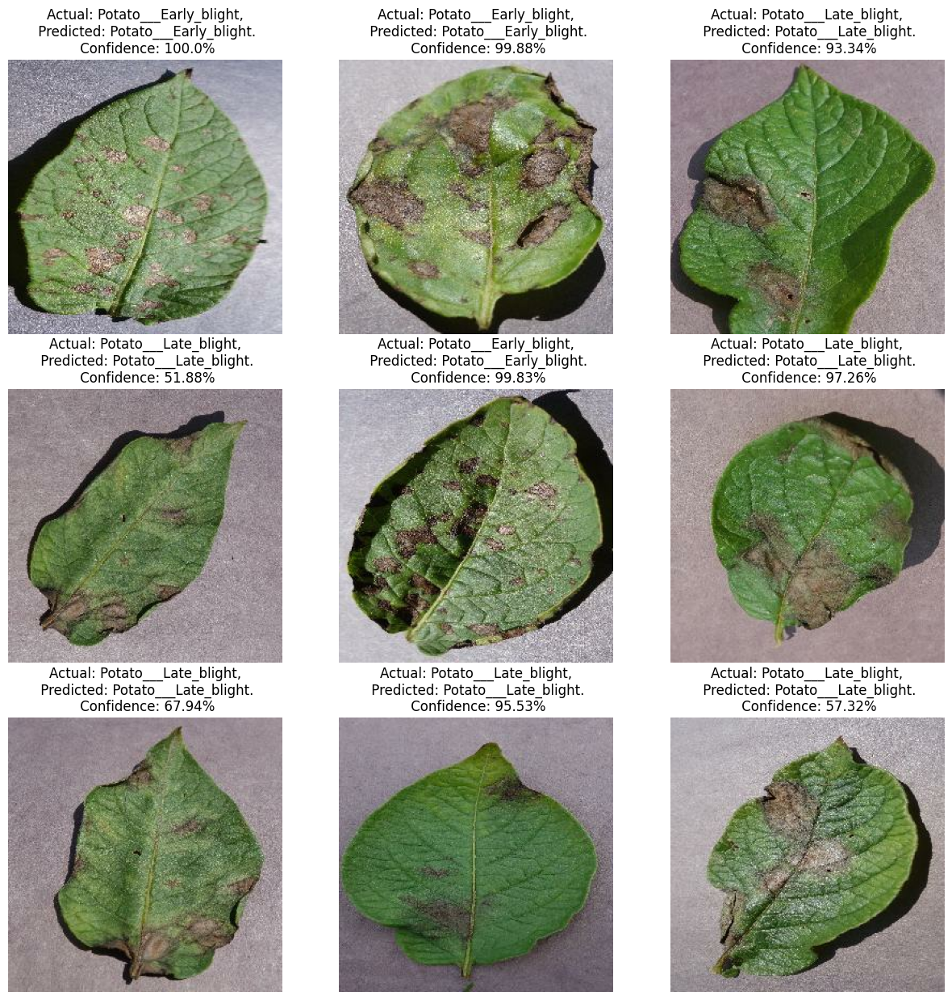

In [61]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

### X Saving model

In [63]:
model_version = "1"
model.export(f"../models/{model_version}") 

INFO:tensorflow:Assets written to: ../models/1\assets


INFO:tensorflow:Assets written to: ../models/1\assets


Saved artifact at '../models/1'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor_62')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  2081977230416: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977224464: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977223504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977224656: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977223312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977223696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977222736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977222928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977222544: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977222352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2081977225040: TensorSpec(shape=(), 